In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds
from torchmetrics import MeanMetric
from tqdm import tqdm
import sklearn
import cv2

from semsegcluster.eval_munkres import get_measurements, measure_from_confusion_matrix
import semsegcluster.data.scannet
from semsegcluster.settings import EXP_OUT
from semsegcluster.data.nyu_depth_v2 import TRAINING_LABEL_NAMES, NYU40_COLORS
import detectron2 as det2
import detectron2.utils.visualizer
from semsegcluster.sacred_utils import get_incense_loader
from deeplab.oaisys_inference import OAISYS_LABELS
from deeplab.oaisys_inference import data_converter_rugd

In [3]:
det2.utils.colormap.random_color(rgb=True).astype(np.uint8)

array([ 84,  84, 255], dtype=uint8)

### Visualize prediction and inlier/outlier

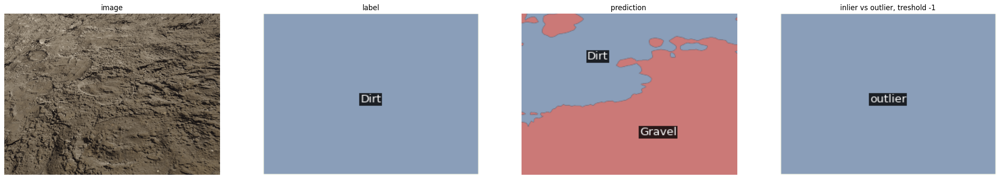

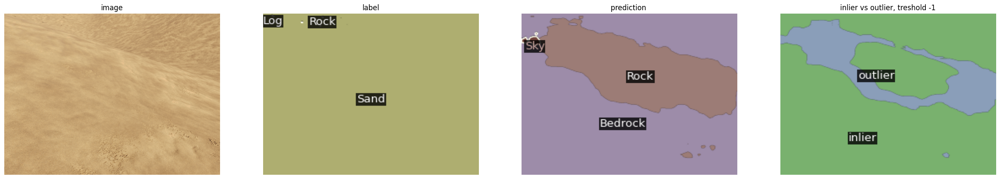

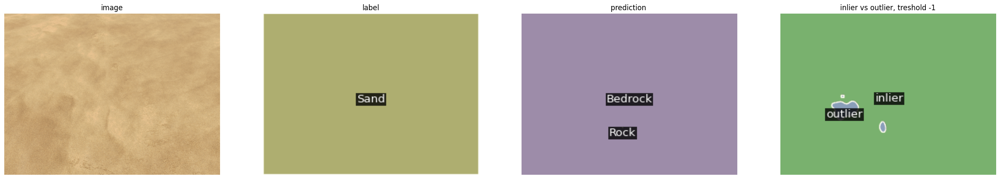

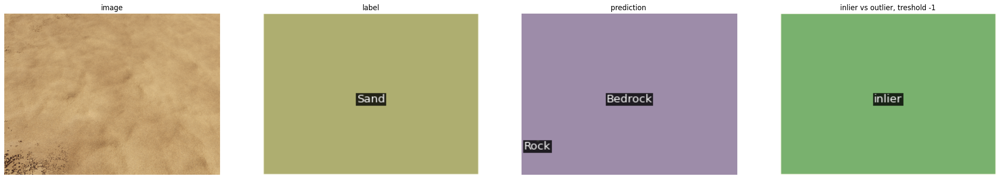

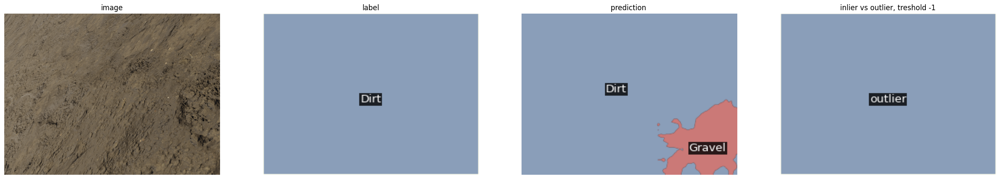

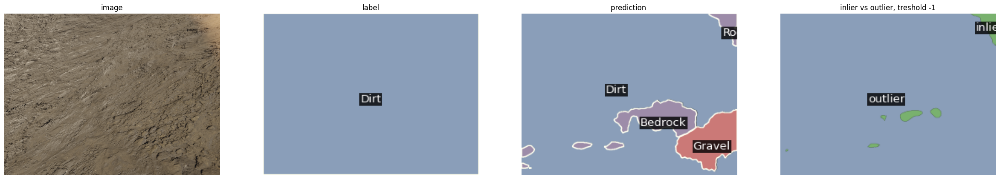

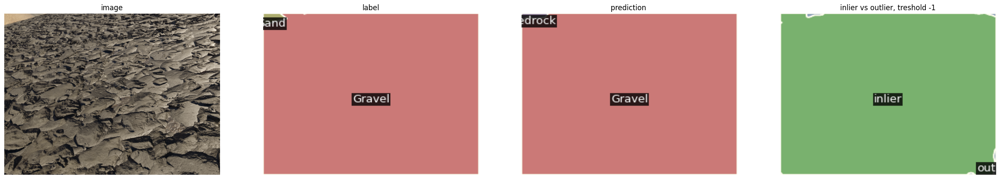

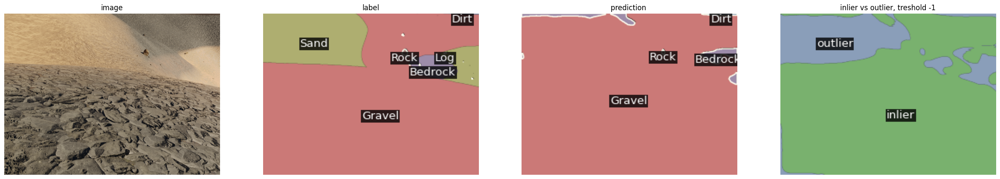

In [6]:
skip_frames = 40
uncert_treshold = -1
subset = 'oaisys_trajectory3'
uncert = 'maxlogit-pp'

directory = os.path.join(EXP_OUT, f'oaisys_inference/{subset}/deeplab')
data = tfds.load(f'{subset}', split='validation')

m = det2.data.Metadata()
m.stuff_classes = OAISYS_LABELS + [f'c{i}' for i in range(80)]
m.stuff_colors = NYU40_COLORS + NYU40_COLORS + NYU40_COLORS
m_bool = det2.data.Metadata()
m_bool.stuff_classes = ['outlier', 'inlier']
m_bool.stuff_colors = NYU40_COLORS
for idx, blob in enumerate(data):
  if idx%skip_frames != 0:
    continue
  image = blob['image']
  label = blob['label']
  image, label = data_converter_rugd(image=image, label=label)
  image = tf.transpose(image, perm=[1, 2, 0]).numpy()
  label = label.numpy()
  pred = np.load(os.path.join(directory, f'{idx}_pred.npy')).squeeze()
  loaded_label = np.load(os.path.join(directory, f'{idx}_label.npy')).squeeze()
  uncertainty = np.load(os.path.join(directory, f'{idx}_{uncert}.npy')).squeeze()
  _, axs = plt.subplots(1, 4, figsize=(30, 20))
  axs[0].imshow(image)
  axs[0].axis('off')
  axs[0].set_title(f'image')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[1].imshow(vis.draw_sem_seg(label).get_image())
  axs[1].axis('off')
  axs[1].set_title(f'label')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[2].imshow(vis.draw_sem_seg(pred).get_image())
  axs[2].axis('off')
  axs[2].set_title(f'prediction ')
  vis = det2.utils.visualizer.Visualizer(image, m_bool, scale=0.4)
  axs[3].imshow(vis.draw_sem_seg(uncertainty<uncert_treshold).get_image())
  axs[3].axis('off')
  axs[3].set_title(f'inlier vs outlier, treshold {uncert_treshold}')
  # vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  # axs[4].imshow(vis.draw_sem_seg(loaded_label).get_image())
  # axs[4].axis('off')
  # axs[4].set_title(f'loaded label {idx}')
  plt.show()

### Visualize Mapping predictions and inliers/outliers

In [ ]:
skip_frames = 40
uncert_treshold = -4.7
subset = 'oaisys_trajectory3'
directory = os.path.join(EXP_OUT, f'oaisys_inference/{subset}/deeplab')
inlier = 'pseudolabel-pred'
#outlier = 'dbscansegandimgnet3027'
uncert = 'maxlogit-pp'
data = tfds.load(f'{subset}', split='validation')

m = det2.data.Metadata()
m.stuff_classes = OAISYS_LABELS + [f'c{i}' for i in range(80)]
m.stuff_colors = NYU40_COLORS + NYU40_COLORS + NYU40_COLORS
m_bool = det2.data.Metadata()
m_bool.stuff_classes = ['outlier', 'inlier']
m_bool.stuff_colors = NYU40_COLORS
for idx, blob in enumerate(data):
  if idx%skip_frames != 0:
    continue
  image = blob['image']
  label = blob['label']
  image, label = data_converter_rugd(image, label)
  image = tf.transpose(image, perm=[1, 2, 0]).numpy()
  label = label.numpy()
  pred = np.load(os.path.join(directory, f'{idx}_pred.npy')).squeeze()
  # uncertainty = np.load(os.path.join(directory, f'{idx}_{uncert}.npy')).squeeze()
  rendered_pred = np.load(os.path.join(directory, f'{idx:06d}_pseudolabel-pred.npy')).squeeze()
  # rendered_uncertainty = np.load(os.path.join(directory, f'{idx:06d}_pseudolabel-{uncert}.npy')).squeeze()
  # i = np.load(os.path.join(directory, f'{frame}_{inlier}.npy')).squeeze()
  # #o = np.load(os.path.join(directory, f'{frame}_{outlier}.npy')).squeeze() + 40
  # #train_signal = i
  # #train_signal[u > -3] = o[u > -3]
  _, axs = plt.subplots(1, 4, figsize=(30, 20))
  axs[0].imshow(image)
  axs[0].axis('off')
  axs[0].set_title(f'image')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[1].imshow(vis.draw_sem_seg(label).get_image())
  axs[1].axis('off')
  axs[1].set_title(f'label')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[2].imshow(vis.draw_sem_seg(pred).get_image())
  axs[2].axis('off')
  axs[2].set_title(f'prediction ')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[3].imshow(vis.draw_sem_seg(rendered_pred).get_image())
  axs[3].axis('off')
  axs[3].set_title(f'rendered prediction')
  # vis = det2.utils.visualizer.Visualizer(image, m_bool, scale=0.4)
  # axs[4].imshow(vis.draw_sem_seg(uncertainty<uncert_treshold).get_image())
  # axs[4].axis('off')
  # axs[4].set_title(f'inlier vs outlier {idx}, treshold {uncert_treshold}')
  # vis = det2.utils.visualizer.Visualizer(image, m_bool, scale=0.4)
  # axs[5].imshow(vis.draw_sem_seg(rendered_uncertainty<uncert_treshold).get_image())
  # axs[5].axis('off')
  # axs[5].set_title(f'rendered inlier vs outlier {idx}, treshold {uncert_treshold}')
  # vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  # #axs[2].imshow(u, vmin=-5, vmax=3)
  # axs[3].imshow(u > -3)
  # axs[3].axis('off')
  plt.show()

### Visualize Prediction, Adapted Prediction

In [ ]:
skip_frames = 16
subset = 'oaisys_trajectory3'
training = '89'
pseudolabel = 'ground-truth'

directory = os.path.join(EXP_OUT, f'oaisys_inference/{subset}/deeplab')
data = tfds.load(f'{subset}', split='validation')

m = det2.data.Metadata()
m.stuff_classes = OAISYS_LABELS + [f'c{i}' for i in range(80)]
m.stuff_colors = NYU40_COLORS + NYU40_COLORS + NYU40_COLORS
for idx, blob in enumerate(data):
  if idx%skip_frames != 0:
    continue
  image = blob['image']
  label = blob['label']
  image, label = data_converter_rugd(image=image, label=label)
  image = tf.transpose(image, perm=[1, 2, 0]).numpy()
  label = label.numpy()
  pred = np.load(os.path.join(directory, f'{idx}_pred.npy')).squeeze()
  try:
    adapted_pred = np.load(os.path.join(directory, f'{idx:06d}_pred{training}-{pseudolabel}.npy')).squeeze()
  except FileNotFoundError:
    adapted_pred = cv2.imread(os.path.join(directory, f'{idx:06d}_pred{training}-{pseudolabel}.png'),
                         cv2.IMREAD_ANYDEPTH).squeeze().astype(np.int32)
  _, axs = plt.subplots(1, 4, figsize=(30, 20))
  axs[0].imshow(image)
  axs[0].axis('off')
  axs[0].set_title(f'image')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[1].imshow(vis.draw_sem_seg(label).get_image())
  axs[1].axis('off')
  axs[1].set_title(f'label')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[2].imshow(vis.draw_sem_seg(pred).get_image())
  axs[2].axis('off')
  axs[2].set_title(f'prediction')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[3].imshow(vis.draw_sem_seg(adapted_pred-1).get_image())
  axs[3].axis('off')
  axs[3].set_title(f'adapted_prediction')
  plt.show()

### Visulaize prediction, uncertainty, merged labels

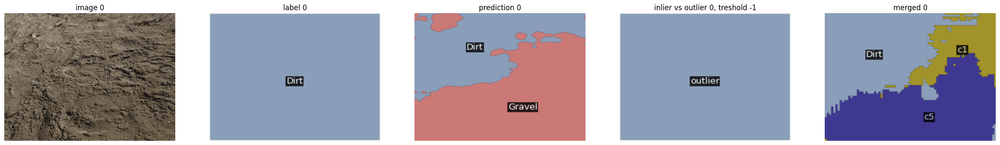

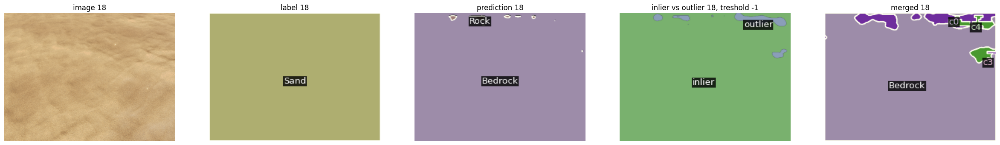

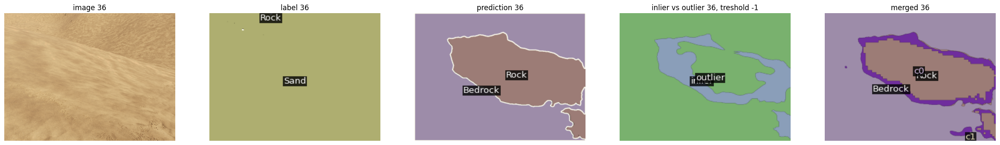

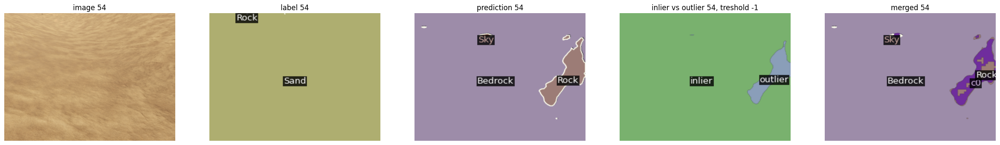

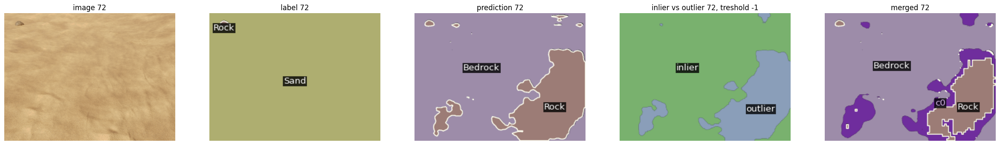

...

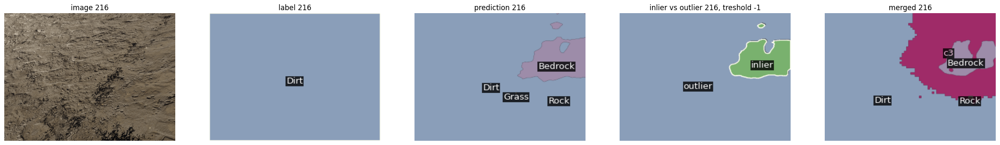

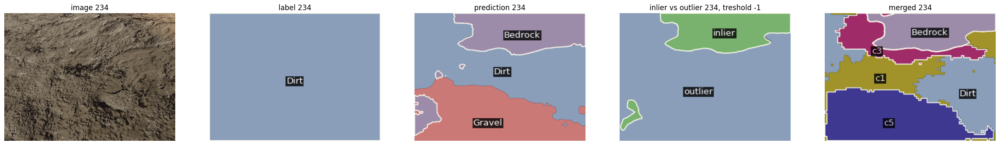

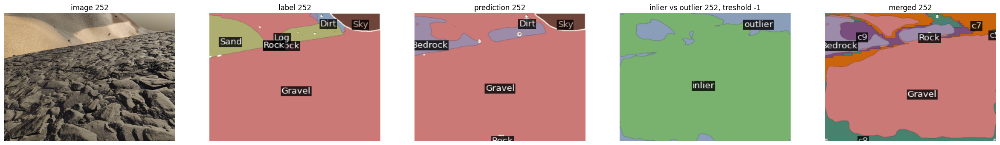

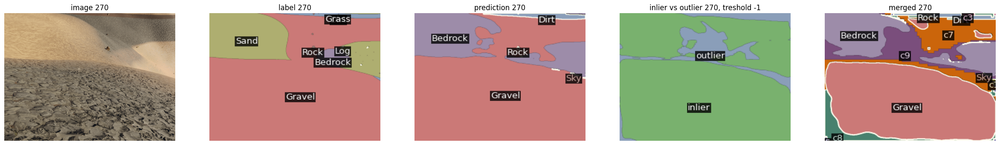

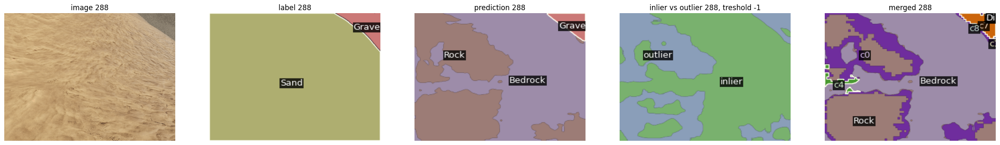

In [7]:
skip_frames = 18
uncert_treshold = -1
subset = 'oaisys_trajectory3'
inlier = 'pred'
outlier = 'seg107'
uncert = 'maxlogit-pp'


directory = os.path.join(EXP_OUT, f'oaisys_inference/{subset}/deeplab')
data = tfds.load(f'{subset}', split='validation')

m = det2.data.Metadata()
m.stuff_classes = OAISYS_LABELS + [f'c{i}' for i in range(80)]
m.stuff_colors = NYU40_COLORS + NYU40_COLORS + NYU40_COLORS
m_bool = det2.data.Metadata()
m_bool.stuff_classes = ['outlier', 'inlier']
m_bool.stuff_colors = NYU40_COLORS
for idx, blob in enumerate(data):
  if idx%skip_frames != 0:
    continue
  image = blob['image']
  label = blob['label']
  image, label = data_converter_rugd(image=image, label=label)
  image = tf.transpose(image, perm=[1, 2, 0]).numpy()
  label = label.numpy()
  pred = np.load(os.path.join(directory, f'{idx}_pred.npy')).squeeze()
  uncertainty = np.load(os.path.join(directory, f'{idx}_{uncert}.npy')).squeeze()
  try:
    merged = np.load(os.path.join(directory, f'{idx:06d}_merged-{inlier}-{outlier}.npy')).squeeze()
  except FileNotFoundError:
    merged = cv2.imread(os.path.join(directory, f'{idx:06d}_merged-{inlier}-{outlier}.png'),
                         cv2.IMREAD_ANYDEPTH).squeeze().astype(np.int32)
  _, axs = plt.subplots(1, 5, figsize=(30, 20))
  axs[0].imshow(image)
  axs[0].axis('off')
  axs[0].set_title(f'image {idx}')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[1].imshow(vis.draw_sem_seg(label).get_image())
  axs[1].axis('off')
  axs[1].set_title(f'label {idx}')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[2].imshow(vis.draw_sem_seg(pred).get_image())
  axs[2].axis('off')
  axs[2].set_title(f'prediction {idx}')
  vis = det2.utils.visualizer.Visualizer(image, m_bool, scale=0.4)
  axs[3].imshow(vis.draw_sem_seg(uncertainty<uncert_treshold).get_image())
  axs[3].axis('off')
  axs[3].set_title(f'inlier vs outlier {idx}, treshold {uncert_treshold}')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[4].imshow(vis.draw_sem_seg(merged).get_image())
  axs[4].axis('off')
  axs[4].set_title(f'merged {idx}')
  plt.show()

### Visuluaize image, label, inliner/outlier, prediction, cluster, pseudolabel

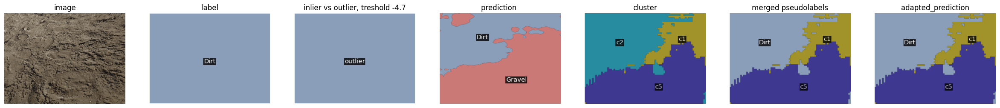

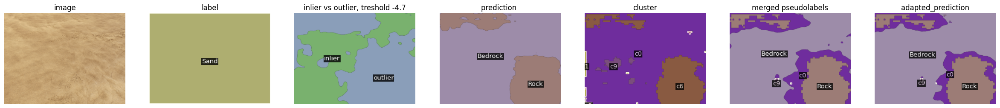

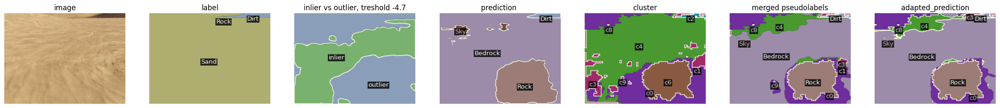

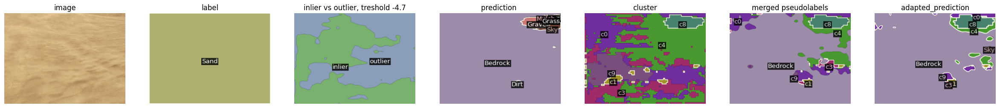

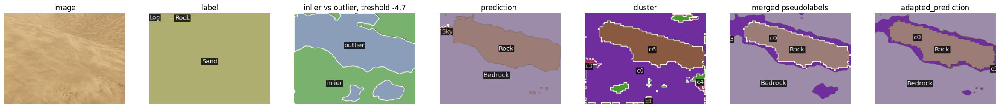

...

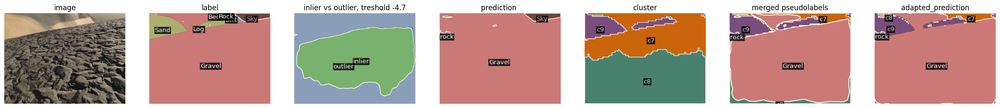

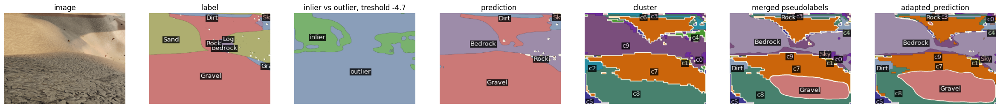

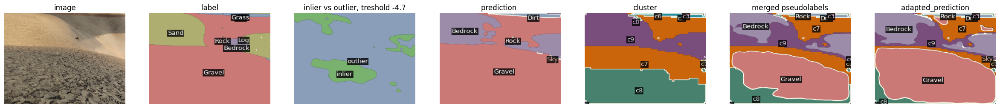

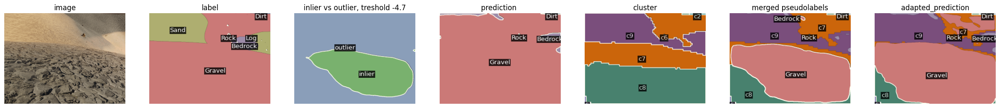

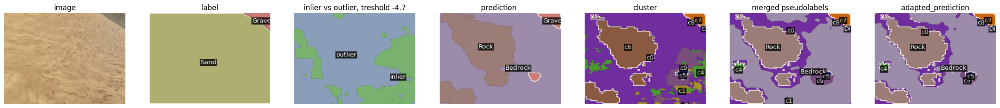

In [9]:
skip_frames = 10
subset = 'oaisys_trajectory3'
training = '107'
clust = 'seg107'
inlier='pred'
uncert = 'maxlogit-pp'
uncert_treshold = -4.7
pseudolabel = 'merged-pseudolabel-pred-seg107'

directory = os.path.join(EXP_OUT, f'oaisys_inference/{subset}/deeplab')
data = tfds.load(f'{subset}', split='validation')

m = det2.data.Metadata()
m.stuff_classes = OAISYS_LABELS + [f'c{i}' for i in range(80)]
m.stuff_colors = NYU40_COLORS + NYU40_COLORS + NYU40_COLORS
m_bool = det2.data.Metadata()
m_bool.stuff_classes = ['outlier', 'inlier']
m_bool.stuff_colors = NYU40_COLORS
for idx, blob in enumerate(data):
  if idx%skip_frames != 0:
    continue
  image = blob['image']
  label = blob['label']
  image, label = data_converter_rugd(image=image, label=label)
  image = tf.transpose(image, perm=[1, 2, 0]).numpy()
  label = label.numpy()
  pred = np.load(os.path.join(directory, f'{idx}_pred.npy')).squeeze()
  uncertainty = np.load(os.path.join(directory, f'{idx}_{uncert}.npy')).squeeze()
  cluster = np.load(os.path.join(directory, f'{idx:06d}_{clust}.npy')).squeeze()
  merged = cv2.imread(os.path.join(directory, f'{idx:06d}_merged-pseudolabel-{inlier}-{clust}.png'),
                         cv2.IMREAD_ANYDEPTH).squeeze().astype(np.int32)
  # try:
  #   adapted_pred = np.load(os.path.join(directory, f'{idx:06d}_pred{training}-{pseudolabel}.npy')).squeeze()
  # except FileNotFoundError:
  #   adapted_pred = cv2.imread(os.path.join(directory, f'{idx:06d}_pred{training}-{pseudolabel}.png'),
  #                        cv2.IMREAD_ANYDEPTH).squeeze().astype(np.int32)
  # try:
  #   adapted_pred_gt = np.load(os.path.join(directory, f'{idx:06d}_pred89-ground-truth.npy')).squeeze()
  # except FileNotFoundError:
  #   adapted_pred_gt = cv2.imread(os.path.join(directory, f'{idx:06d}_pred89-ground-truth.png'),
  #                        cv2.IMREAD_ANYDEPTH).squeeze().astype(np.int32)
  _, axs = plt.subplots(1, 6, figsize=(30, 20))
  axs[0].imshow(image)
  axs[0].axis('off')
  axs[0].set_title(f'image')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[1].imshow(vis.draw_sem_seg(label).get_image())
  axs[1].axis('off')
  axs[1].set_title(f'label')
  vis = det2.utils.visualizer.Visualizer(image, m_bool, scale=0.4)
  axs[2].imshow(vis.draw_sem_seg(uncertainty<uncert_treshold).get_image())
  axs[2].axis('off')
  axs[2].set_title(f'inlier vs outlier, treshold {uncert_treshold}')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[3].imshow(vis.draw_sem_seg(pred).get_image())
  axs[3].axis('off')
  axs[3].set_title(f'prediction ')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[4].imshow(vis.draw_sem_seg(cluster+17).get_image())
  axs[4].axis('off')
  axs[4].set_title(f'cluster')
  vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  axs[5].imshow(vis.draw_sem_seg(merged).get_image())
  axs[5].axis('off')
  axs[5].set_title(f'merged pseudolabels')
  # vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  # axs[6].imshow(vis.draw_sem_seg(adapted_pred).get_image())
  # axs[6].axis('off')
  # axs[6].set_title(f'adapted_prediction')
  # vis = det2.utils.visualizer.Visualizer(image, m, scale=0.4)
  # axs[7].imshow(vis.draw_sem_seg(adapted_pred_gt).get_image())
  # axs[7].axis('off')
  # axs[7].set_title(f'adapted_prediction')
  plt.show()